# District Level Relationships with High School Science and Biology Benchmarks

** The following report uses EOG and EOC benchmarks in Science and Biology summarized by NC school district to explore the relationships between educational attainment in Science and various school district statistics.  **

** Data Sources: **
* This report uses NC school district data from the 2016-2017 school year.
* Source code and details for the datasets are located here: 
 * https://github.com/jakemdrew/EducationDataNC/tree/master/2017/School%20Datasets

** Report Details: **
* Each report charts a single benchmark in Science or Biology summarized by school district with 42 district level variables considered for all school districts in North Carolina.  
* Individual regression lines are fit to each pairwise combination of income tax and school district variables. 
* Pearson correlation coefficients are calculated and all statistically significant relationships (p <= 0.05) are reported. 
* Kernel Density Estimates (KDE charts) are provided for the vertical and horizontal axis of each chart.  These show the estimated densities (PDF - Probability density functions) for individual values between the min and max value ranges of each variable.   

** Science Benchmarks Explored: **
* **ACTScience_ACTBenchmark_All** - The SCT Science benchmark for all high school students.
* **EOCBiology_CACR_All** - The End of Course College and Career Ready Biology benchmark for all high school students.
* **EOCBiology_GLP_All** - The End of Course Grade Level Proficiency Biology benchmark for all high school students.
* **EOCBiology_GLP_EDS** - The End of Course Grade Level Proficiency Biology benchmark for economically disadvantagesd high school students.
* **EOCBiology_GLP_SWD** - The End of Course Grade Level Proficiency Biology benchmark for high school students with disabilities.

## Cleaning Up the Data

In [29]:
#import required Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

year = '2017'
schoolDsName = 'PublicHighSchools2017.csv'

#Read in high school data
path='C:/Users/Jake/Documents/GitHub/EducationDataNC/' + year + '/School Datasets/' + schoolDsName
schoolData=pd.read_csv(path, low_memory=False)

In [30]:
#Isolate school district level columns
leaCols = schoolData.columns[schoolData.columns.str.lower().str.contains('lea_')]
distSchoolData = schoolData[leaCols]

#Get first non-null value for each district level field 
#(School district level data is duplicated for each campus in district)
distSchoolData = distSchoolData.groupby('Lea_Name').first()

#Inspect school district data fields selected
distSchoolData.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Data columns (total 53 columns):
lea_avg_student_num               115 non-null float64
lea_total_expense_num             115 non-null float64
lea_salary_expense_pct            115 non-null float64
lea_benefits_expense_pct          0 non-null float64
lea_services_expense_pct          115 non-null float64
lea_supplies_expense_pct          115 non-null float64
lea_instruct_equip_exp_pct        115 non-null float64
lea_other_expense_pct             115 non-null float64
lea_federal_perpupil_num          115 non-null float64
lea_local_perpupil_num            115 non-null float64
lea_state_perpupil_num            115 non-null float64
lea_building_expense_pct          0 non-null float64
lea_sat_avg_score_num             114 non-null float64
lea_sat_participation_pct         114 non-null float64
lea_esea_attendance               0 non-null float64
lea_ap_participation_pct          89 

In [31]:
#Isolate Biology and Science columns
sciTotCols = schoolData.columns[schoolData.columns.str.contains('EOCBiology_') 
                              | schoolData.columns.str.contains('ACTScience_')
                              | schoolData.columns.str.contains('Lea_Name') ]
sciSchoolData = schoolData[sciTotCols]

#Get the mean Biology and Science benchmark scores by district.  
sciSchoolData = sciSchoolData.groupby('Lea_Name').mean()

#Inspect school district data fields selected
sciSchoolData.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Data columns (total 39 columns):
ACTScience_ACTBenchmark_All               115 non-null float64
EOCBiology_CACR_All                       115 non-null float64
EOCBiology_GLP_All                        115 non-null float64
ACTScience_ACTBenchmark_Female            115 non-null float64
EOCBiology_CACR_Female                    115 non-null float64
EOCBiology_GLP_Female                     115 non-null float64
ACTScience_ACTBenchmark_Male              115 non-null float64
EOCBiology_CACR_Male                      115 non-null float64
EOCBiology_GLP_Male                       115 non-null float64
ACTScience_ACTBenchmark_AmericanIndian    115 non-null float64
EOCBiology_CACR_AmericanIndian            115 non-null float64
EOCBiology_GLP_AmericanIndian             115 non-null float64
ACTScience_ACTBenchmark_Asian             115 non-null float64
EOCBiology_CACR_Asian                

In [32]:
print('*********************************Start: Merge Science and School District Data*********************************')
distSchoolData.info(verbose=False)
print(' ')
sciSchoolData.info(verbose=False)
print(' ')

#Merge profile and profileMetric data
distSchoolData = distSchoolData.merge(sciSchoolData,how='left',on='Lea_Name', suffixes=('', '_Drop'))

print('*********************************After: Merge Science and School District Data**************************')
distSchoolData.info(verbose=False)

*********************************Start: Merge Science and School District Data*********************************
<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Columns: 53 entries, lea_avg_student_num to 4-10 Years_LEA_Exp_Pct_Prin
dtypes: float64(53)
memory usage: 48.5+ KB
 
<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Columns: 39 entries, ACTScience_ACTBenchmark_All to EOCBiology_GLP_AIG
dtypes: float64(39)
memory usage: 35.9+ KB
 
*********************************After: Merge Science and School District Data**************************
<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Columns: 92 entries, lea_avg_student_num to EOCBiology_GLP_AIG
dtypes: float64(92)
memory usage: 83.6+ KB


## Visualizing District Level Features

In [17]:
#Create a function to plot regression lines for two variables
def PlotJoint(x,y,data):
    sns.set(context='notebook', style='darkgrid', font_scale=1.25)
    my_plot = sns.jointplot(x=x, y=y, data=data, kind="reg");
    my_plot.fig.set_figwidth(8)
    my_plot.fig.set_figheight(8)

In [18]:
#Make a list of 42 district level features to make plots for
leaCols = ['lea_avg_student_num', 'lea_total_expense_num',
           'lea_salary_expense_pct', 'lea_services_expense_pct', 
           'lea_supplies_expense_pct','lea_instruct_equip_exp_pct', 
           'lea_other_expense_pct', 'lea_federal_perpupil_num', 
           'lea_local_perpupil_num', 'lea_state_perpupil_num',
           'lea_sat_avg_score_num', 'lea_sat_participation_pct',
           'lea_ap_participation_pct', 'lea_ap_pct_3_or_above',
           'lea_ib_pct_4_or_above', 'lea_total_specialized_courses',
           'lea_ap_ib_courses', 'lea_cte_courses', 
           'lea_univ_college_courses', 'lea_avg_daily_attend_pct', 
           'lea_crime_per_c_num','lea_short_susp_per_c_num', 
           'lea_long_susp_per_c_num', 'lea_expelled_per_c_num', 
           'lea_stud_internet_comp_num', 'lea_avg_age_media_collection', 
           'lea_books_per_student', 'lea_wap_num', 
           'lea_wap_per_classroom', 'lea_flicensed_teach_pct',
           'lea_tchyrs_0thru3_pct', 'lea_tchyrs_4thru10_pct',
           'lea_tchyrs_11plus_pct', 'lea_class_teach_num', 
           'lea_nbpts_num', 'lea_advance_dgr_pct', 
           'lea_1yr_tchr_trnovr_pct', 'lea_emer_prov_teach_pct', 
           'lea_lateral_teach_pct', '0-3 Years_LEA_Exp_Pct_Prin',
           '10+ Years_LEA_Exp_Pct_Prin', '4-10 Years_LEA_Exp_Pct_Prin']

## District Level Relationships with the ACT Science Benchmark
** The following charts explore the relationship between a school district's average ACT Science benchmarks and various school district statistics.** 

**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* 'Avg Tot Income' = 'Tot income Amt All' / 'Tot income Ct All'

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District average student numbers increase as Average ACT Science Benchmark increases.
* District total expenses decrease as Average ACT Science Benchmark increases.
* District salaries as a percent of total expenses increase as Average ACT Science Benchmark increases.
* District services as a percent of total expenses decrease as Average ACT Science Benchmark increases.
* District supplies as a percent of total expenses decrease as Average ACT Science Benchmark increases.
* District federal funding per pupil decreases significantly as Average ACT Science Benchmark increases.
* District local funding per pupil increases as Average ACT Science Benchmark increases.
* District state funding per pupil decreases as Average ACT Science Benchmark increases.
* District average SAT scores increase significantly as Average ACT Science Benchmark increases.
* District AP participation percentages increase as Average ACT Science Benchmark increases.
* District AP pct 3 or above increases significantly as Average ACT Science Benchmark increases.
* District AP IB courses increase significantly as Average ACT Science Benchmark increases.
* District CTE courses decrease as Average ACT Science Benchmark increases.
* District univ college courses decrease as Average ACT Science Benchmark increases.
* District average daily attendance percentages increase as Average ACT Science Benchmark increases.
* District short term suspensions decrease as Average ACT Science Benchmark increases.
* District crime, long term suspensions, and expulsions do not appear to be correlated with Average ACT Science Benchmark changes. 
* District student internet connected computers increase as Average ACT Science Benchmark increases.
* The average age of a district's media collection increases as Average ACT Science Benchmark increases.
* District books per student decrease as Average ACT Science Benchmark increases. 
* District total wireless access points increase as Average ACT Science Benchmark increases.
* District total wireless access points per classroom decrease as Average ACT Science Benchmark increases.
* District fully licensed teachers increase as Average ACT Science Benchmark increases.
* District teachers with 0-3 years experience decreases as Average ACT Science Benchmark increases.
* District teachers with 4-10 years experience increase as Average ACT Science Benchmark increases.
* District teachers with 11+ years experience increase as Average ACT Science Benchmark increases.
* District class teacher numbers increase as Average ACT Science Benchmark increases.
* District average number of National Board Certified Staff increase as Average ACT Science Benchmark increases.
* District percentage of advanced degrees increase as Average ACT Science Benchmark increases.
* District one year teacher turnover decreases as Average ACT Science Benchmark increases.
* District emer prov teacher percentages decreases as Average ACT Science Benchmark increases.
* District lateral entry teacher percentages decrease significantly as Average ACT Science Benchmark increases.
* District principals with 0-3 years experience decreases as Average ACT Science Benchmark increases.
* District principals with 10+ years experience increases as Average ACT Science Benchmark increases.
* District principals with 4-10 years experience increases as Average ACT Science Benchmark increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

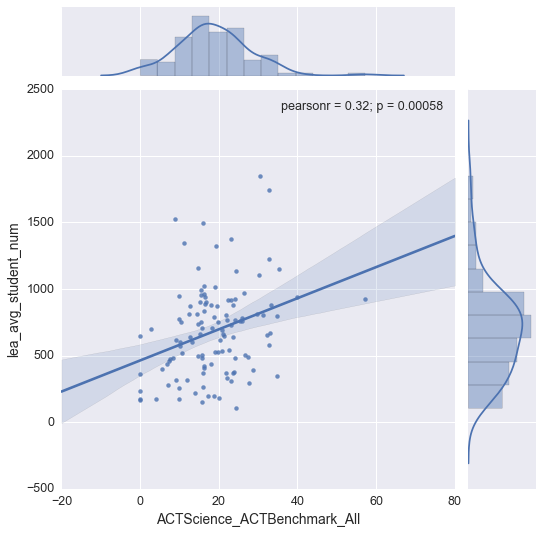

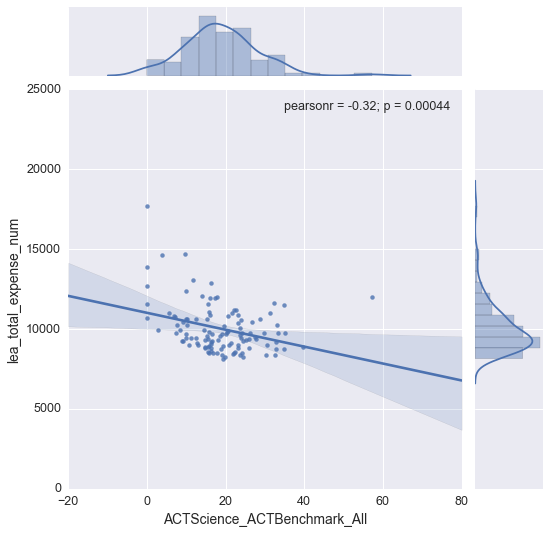

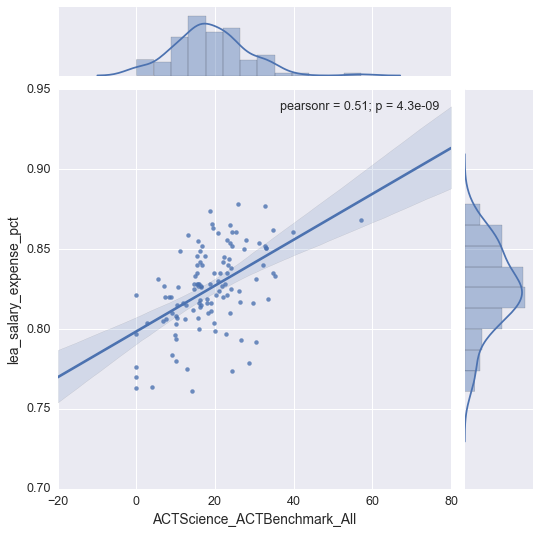

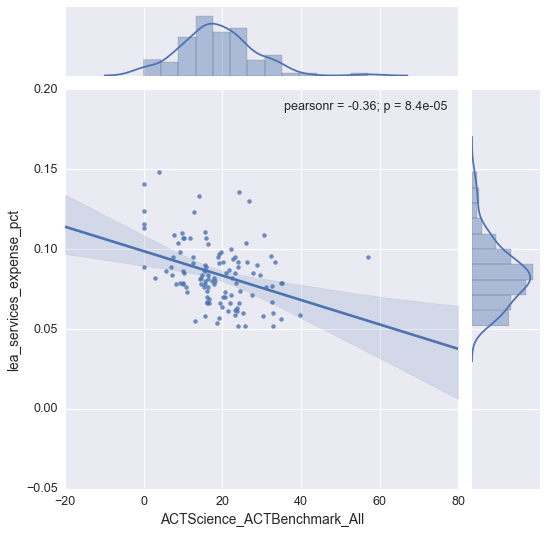

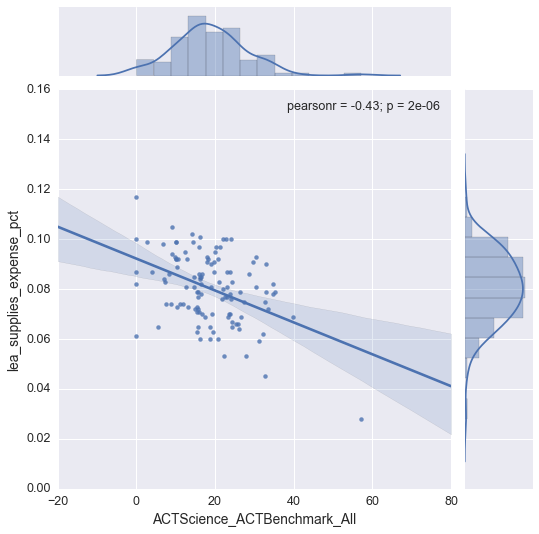

...

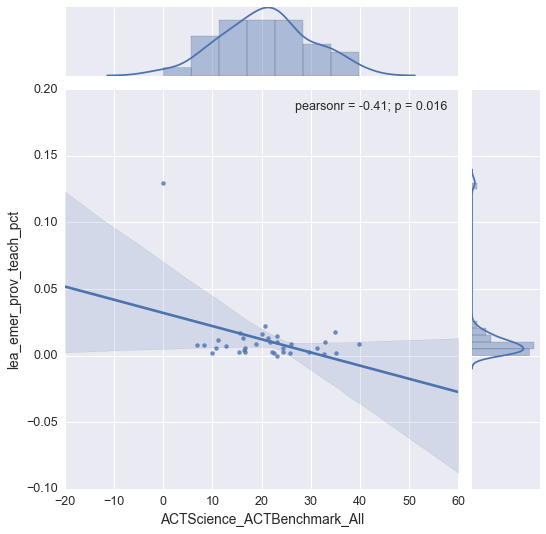

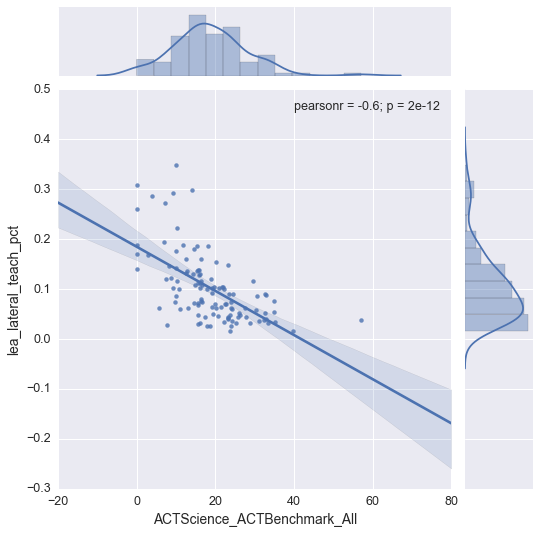

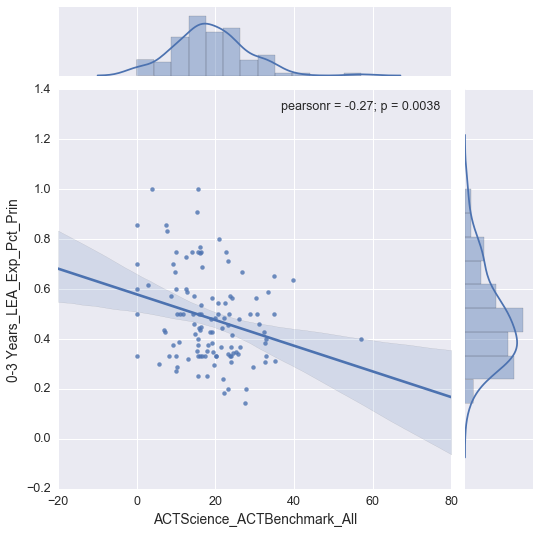

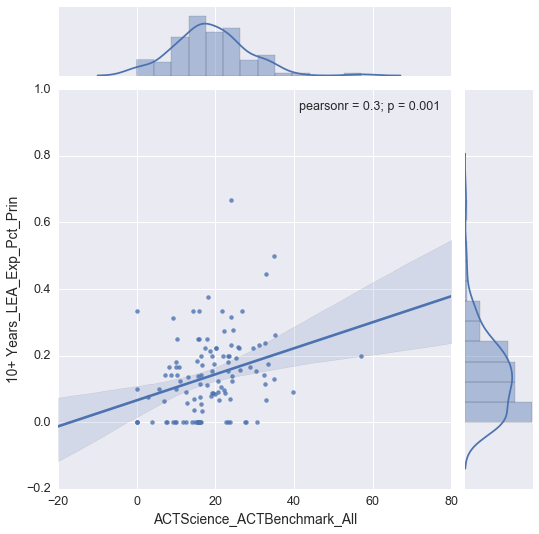

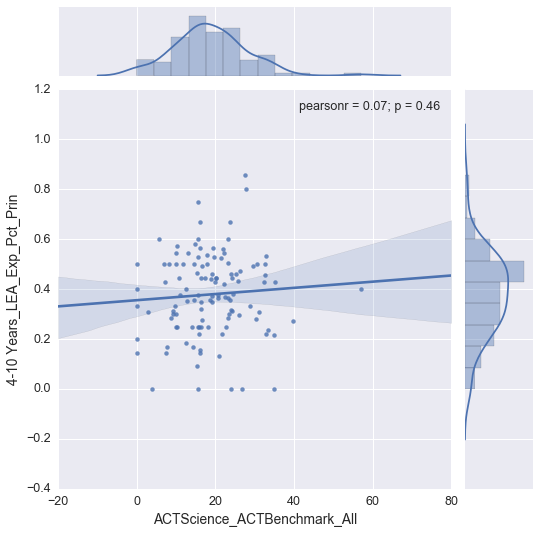

In [23]:
#Create district level charts to compare against Avg Tot Income
for col in leaCols:
    try:
        PlotJoint(x='ACTScience_ACTBenchmark_All',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with College and Career Ready (CACR) Biology Benchmarks
** The following charts explore the relationship between a school district's average College and Career Ready (CACR) Biology Benchmarks and various school district statistics.** 

**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* 'Avg Dependents Per Ret' = 'Number of dependents All' \ 'Number of returns All'


**Key observations include statistically significant positive / negative correlations and are as follows: **
* District average student numbers increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District salaries as a percent of total expenses increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District services as a percent of total expenses decrease as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District supplies as a percent of total expenses decrease as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District federal funding per pupil decreases significantly as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District local funding per pupil increases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District state funding per pupil decreases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District average SAT scores increase significantly as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District AP participation percentages increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District AP pct 3 or above increases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District AP IB courses increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District CTE courses decrease as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District average daily attendance percentages increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District short term suspensions decrease as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District crime, long term suspensions, and expulsions do not appear to be correlated with Average College and Career Ready (CACR) Biology Benchmarks changes. 
* District student internet connected computers increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* The average age of a district's media collection increases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District fully licensed teachers increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District teachers with 0-3 years experience decreases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District teachers with 11+ years experience increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District class teacher numbers increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District average number of National Board Certified Staff increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District percentage of advanced degrees increase as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District one year teacher turnover decreases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District emer prov teacher percentages decreases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District lateral entry teacher percentages decrease significantly as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District principals with 0-3 years experience decreases as Average College and Career Ready (CACR) Biology Benchmarks increases.
* District principals with 10+ years experience increases as Average College and Career Ready (CACR) Biology Benchmarks increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

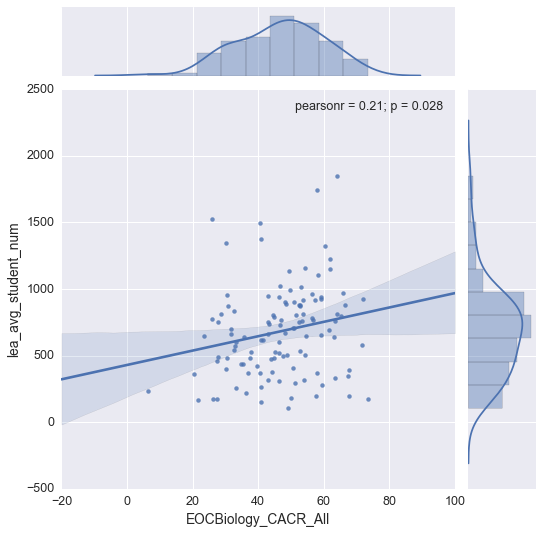

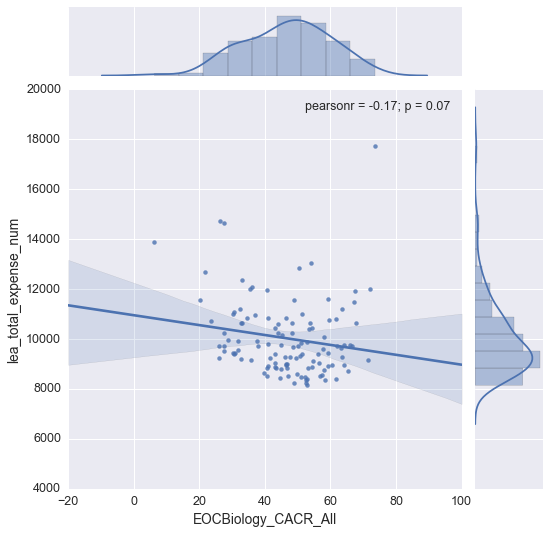

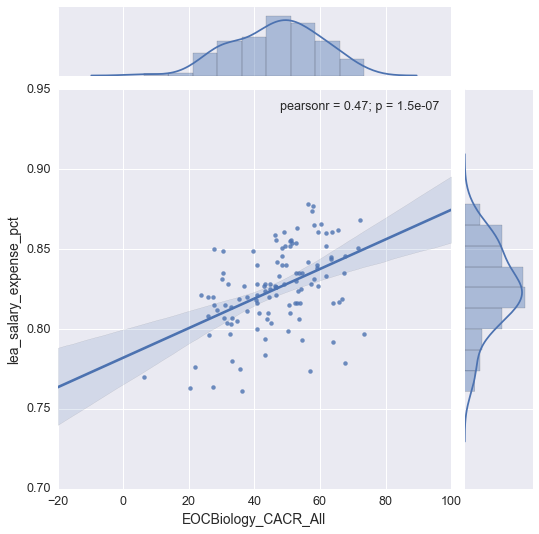

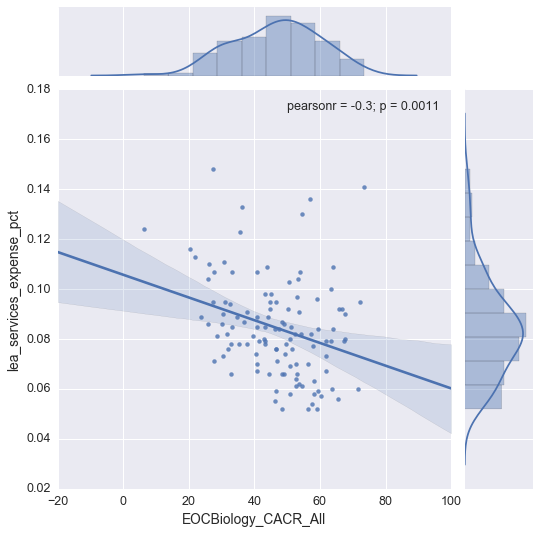

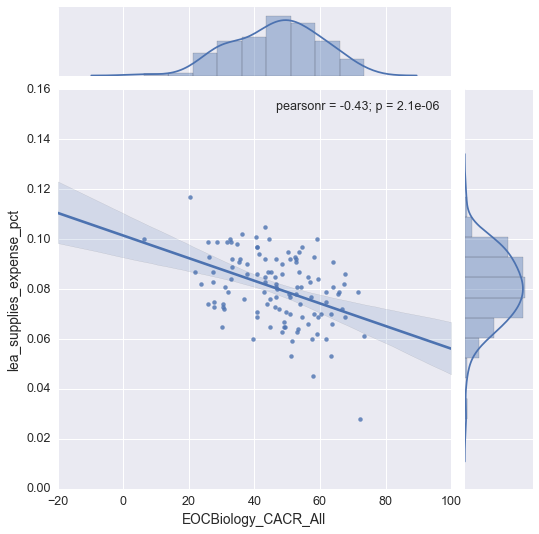

...

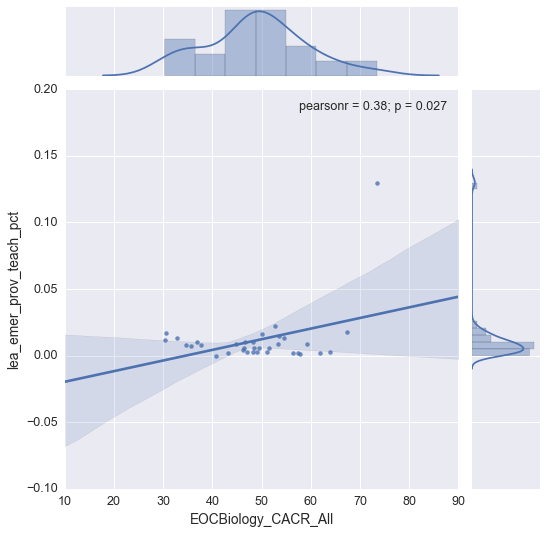

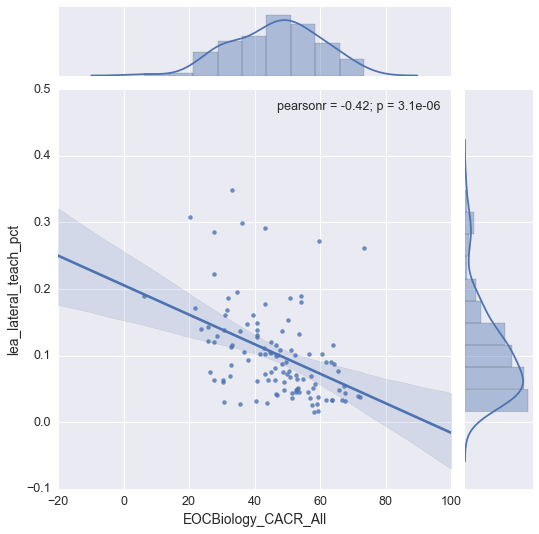

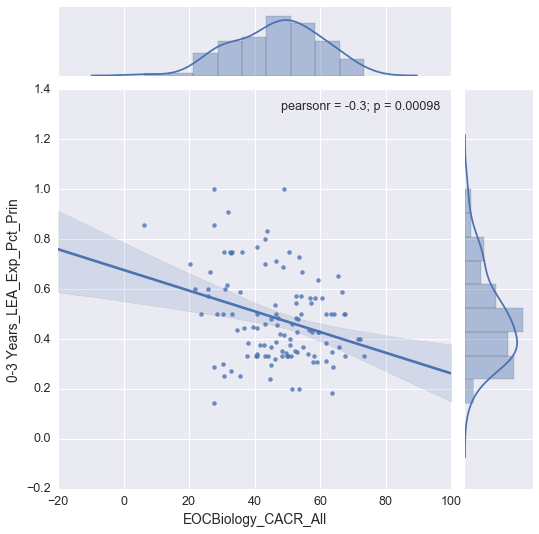

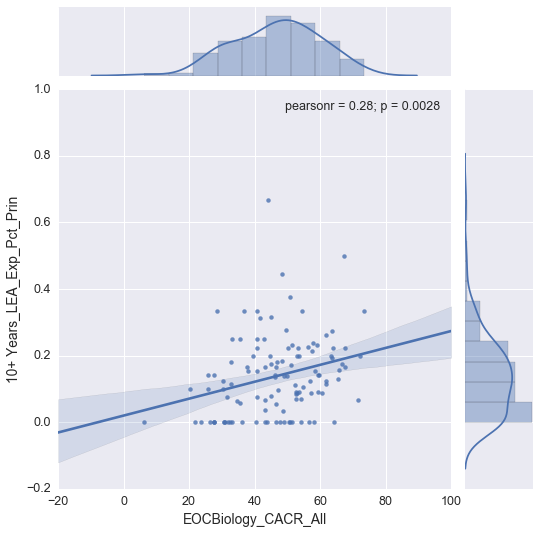

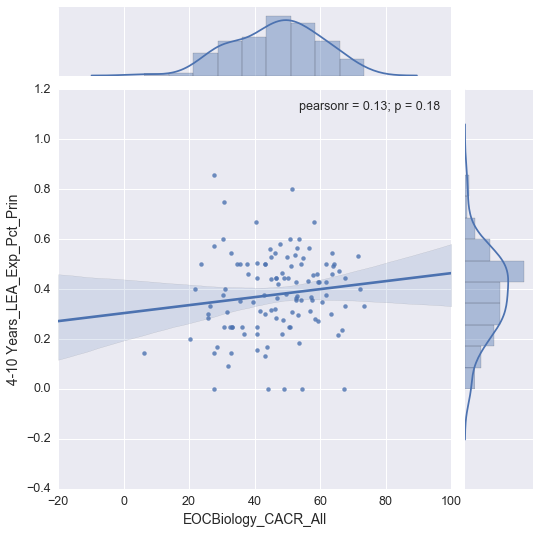

In [25]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCBiology_CACR_All',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with Grade Level Proficiency (GLP) Biology Benchmarks
** The following charts explore the relationship between a school district's average Grade Level Proficiency (GLP) Biology Benchmarks and various school district statistics.** 

**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* Avg Personal Property Taxes = Personal property taxes Amt All / Personal property taxes Ct All

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District salaries as a percent of total expenses increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases. 
* District services as a percent of total expenses decrease as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District supplies as a percent of total expenses decrease as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District federal funding per pupil decreases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District local funding per pupil increases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District state funding per pupil decreases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District average SAT scores increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District SAT participation percentages decrease as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District AP participation percentages increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District AP pct 3 or above increases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District AP IB courses increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District CTE courses decrease as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District univ college courses decrease as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District average daily attendance percentages increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District short term suspensions decrease as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District crime, long term suspensions, and expulsions do not appear to be correlated with Average Grade Level Proficiency (GLP) Biology Benchmarks changes. 
* District student internet connected computers increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* The average age of a district's media collection increases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District fully licensed teachers increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District teachers with 0-3 years experience decreases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District teachers with 11+ years experience increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District average number of National Board Certified Staff increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District percentage of advanced degrees increase as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District one year teacher turnover decreases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District emer prov teacher percentages increases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District lateral entry teacher percentages decrease significantly as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District principals with 0-3 years experience decreases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.
* District principals with 10+ years experience increases as Average Grade Level Proficiency (GLP) Biology Benchmarks increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

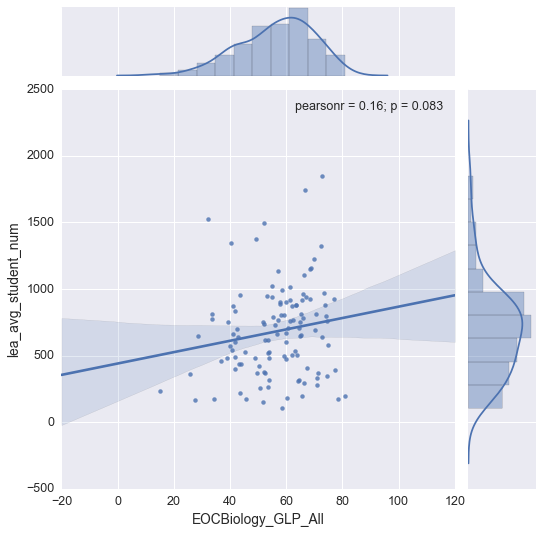

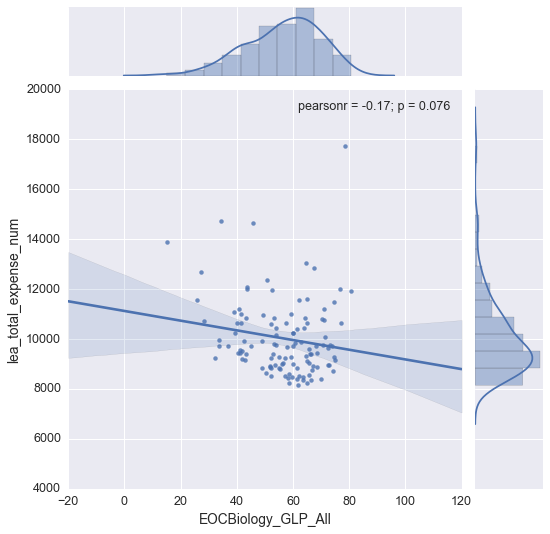

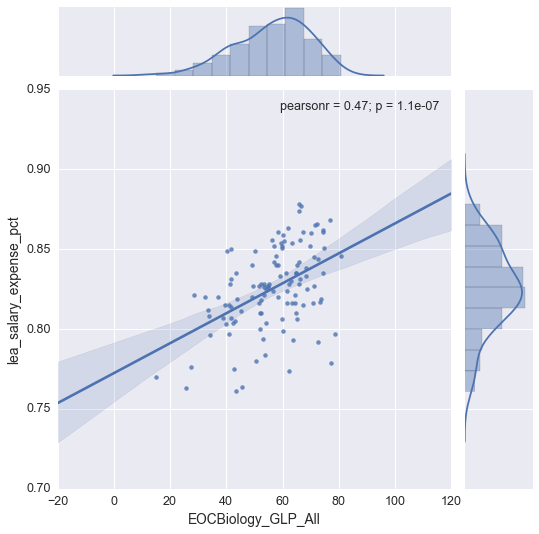

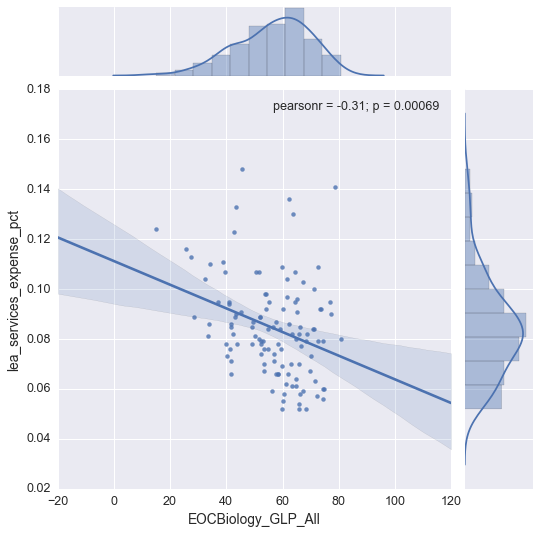

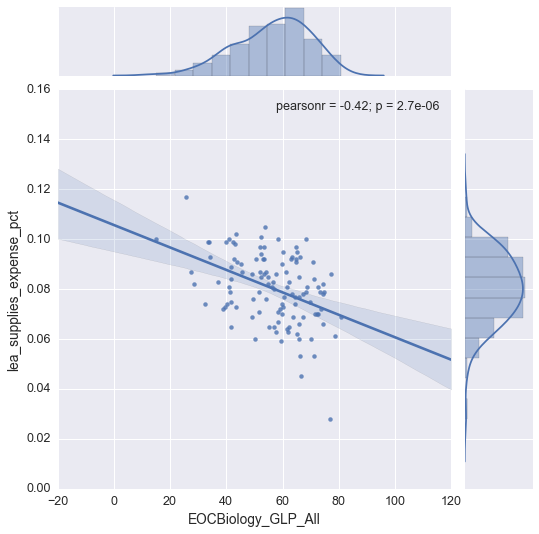

...

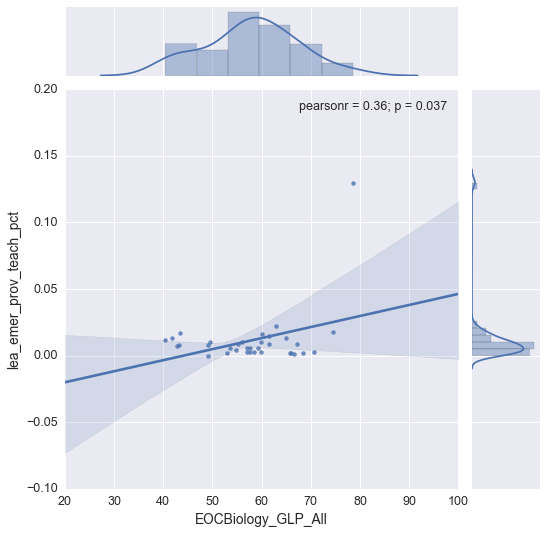

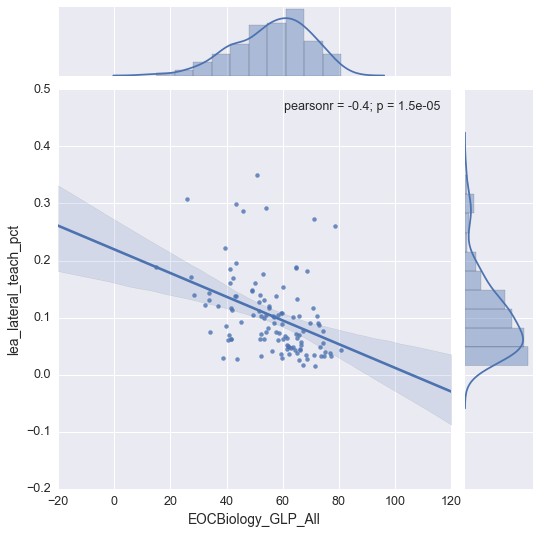

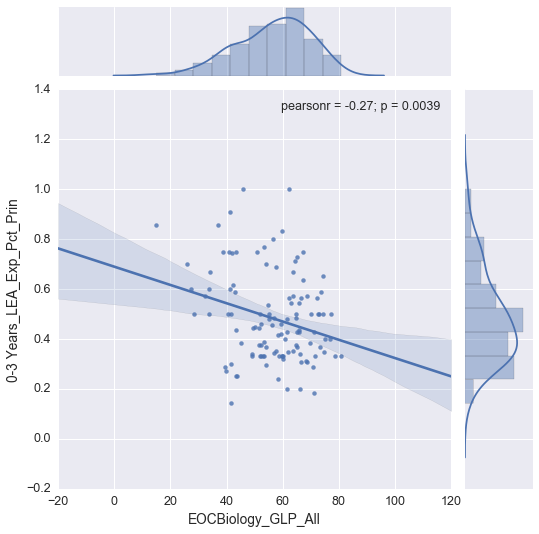

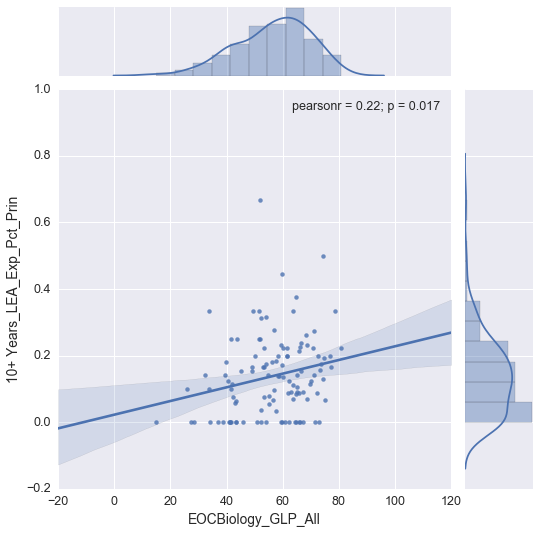

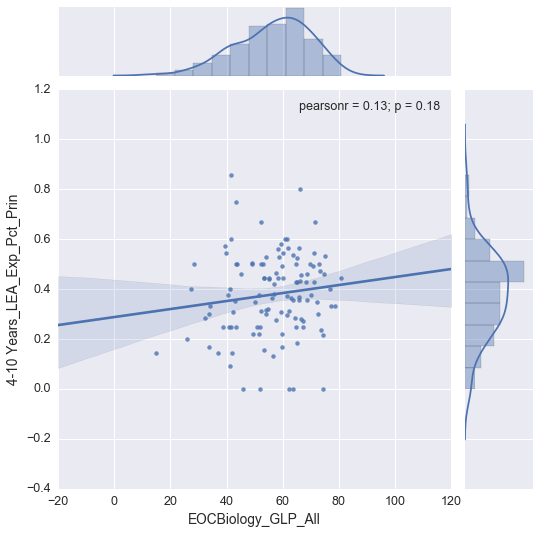

In [26]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCBiology_GLP_All',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with Biology Grade Level Proficiency (GLP) for Economically Disadvantaged Students 
** The following charts explore the relationship between a school district's average Biology Grade Level Proficiency (GLP) Benchmarks for economically disadvantaged students and various school district statistics.** 


**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* Pct of Farm Returns = Number of farm returns All / Number of returns All  

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District total expenses decrease as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District salaries as a percent of total expenses increase as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District services as a percent of total expenses decrease as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District federal funding per pupil decreases as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District state funding per pupil decreases as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District average SAT scores increase as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District SAT participation perdentages decrease as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District CTE courses decrease as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District univ college courses increase as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District average daily attendance percentages increase as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District crime, long and short term suspensions, and expulsions do not appear to be correlated with Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students  changes. 
* District books per student decrease as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases. 
* District fully licensed teachers increase as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District teachers with 0-3 years experience decreases as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District emer prov teacher percentages decreases as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.
* District lateral entry teacher percentages decrease as Average Biology Grade Level Proficiency (GLP) for economically disadvantaged students increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

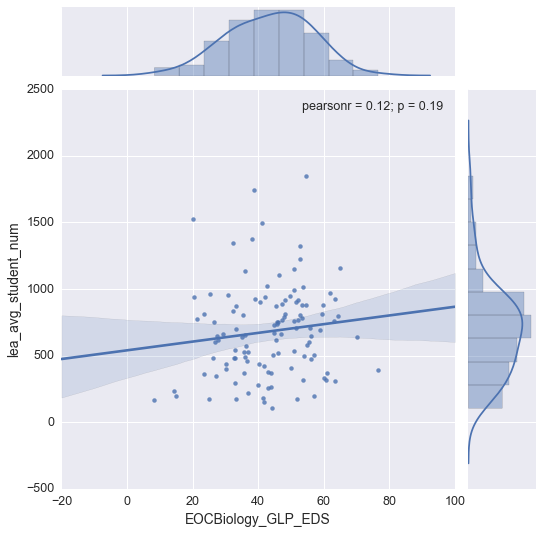

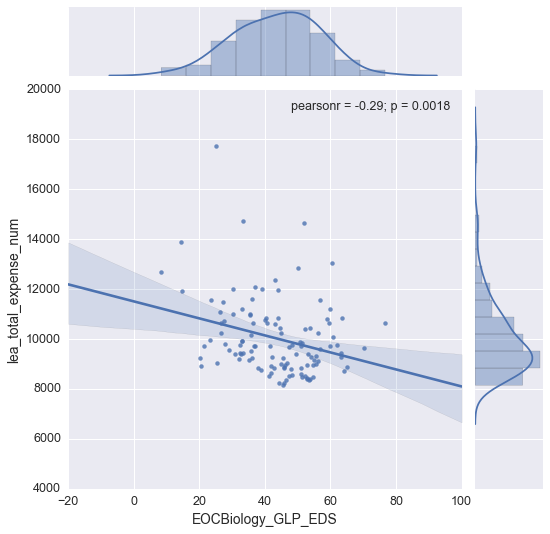

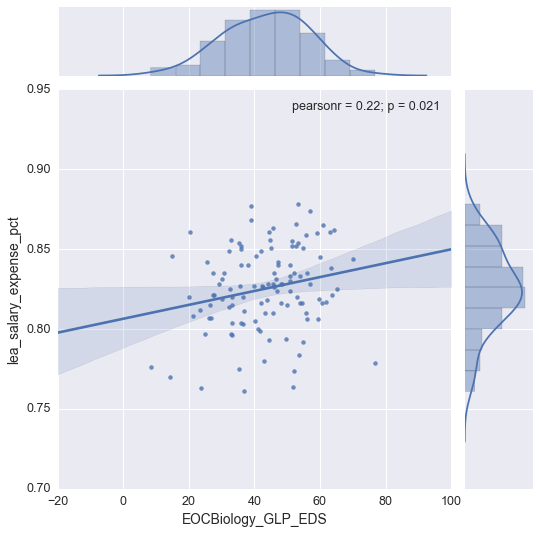

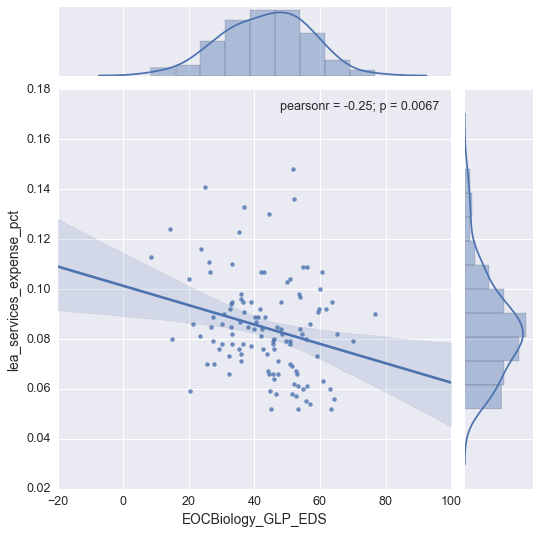

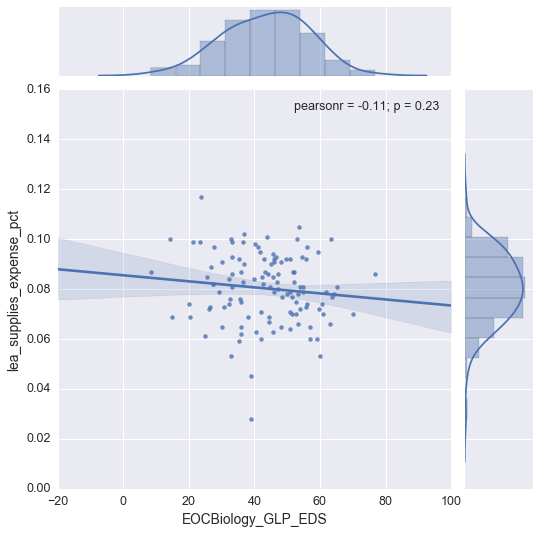

...

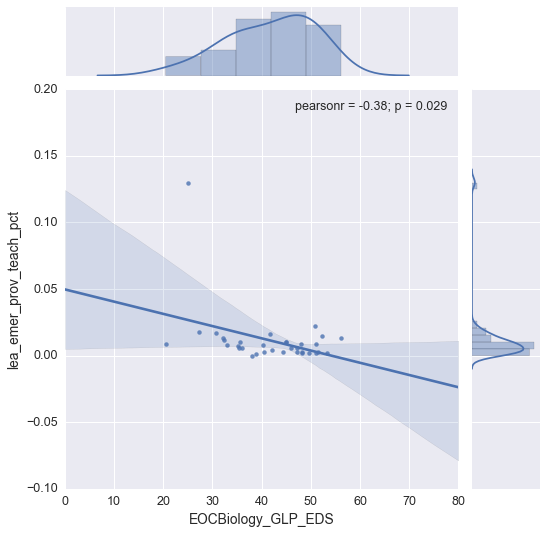

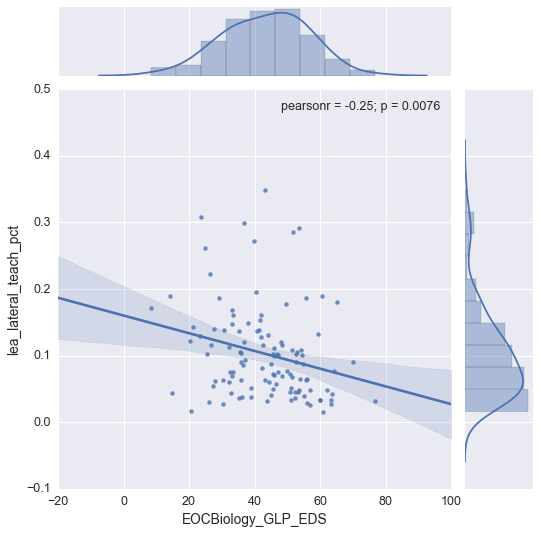

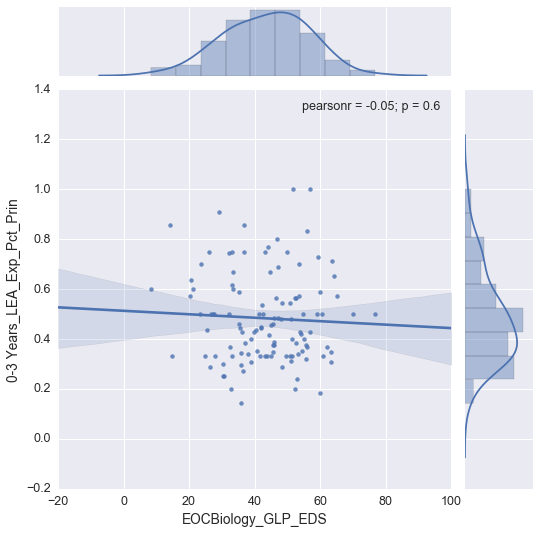

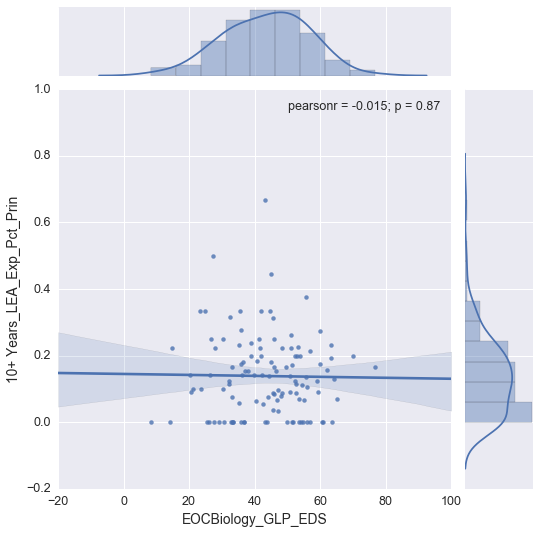

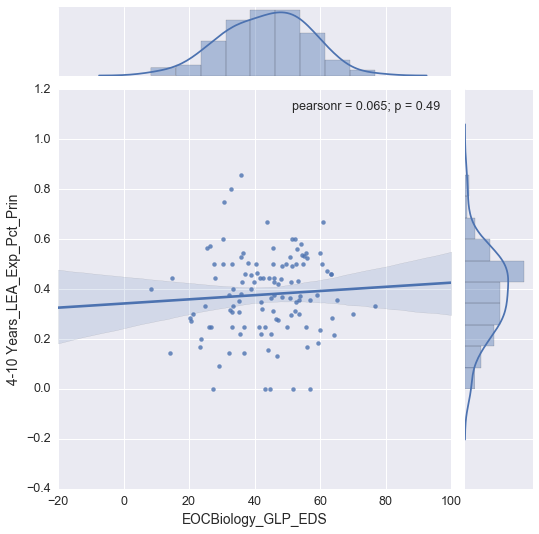

In [27]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCBiology_GLP_EDS',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with Biology Grade Level Proficiency (GLP) for Students with Disabilities 
** The following charts explore the relationship between a school district's average Biology Grade Level Proficiency (GLP) Benchmarks for students with disabilities and various school district statistics.** 


**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* Pct of Farm Returns = Number of farm returns All / Number of returns All  

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District average student numbers increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District total expenses decrease as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District salaries as a percent of total expenses increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District services as a percent of total expenses decrease as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District supplies as a percent of total expenses decrease as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District federal funding per pupil decreases as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District state funding per pupil decreases as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District average SAT scores increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District AP participation percentages increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District AP pct 3 or above increases as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District AP IB courses increase significantly as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District univ college courses decrease as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District average daily attendance percentages increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District crime, short and long term suspensions, and expulsions do not appear to be correlated with Average Biology Grade Level Proficiency (GLP) for students with disabilities students  changes. 
* District books per student decrease as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases. 
* District fully licensed teachers increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District teachers with 0-3 years experience decreases as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District class teacher numbers increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District average number of National Board Certified Staff increase as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District one year teacher turnover decreases as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District emer prov teacher percentages decreases as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.
* District lateral entry teacher percentages decrease significantly as Average Biology Grade Level Proficiency (GLP) for students with disabilities students increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

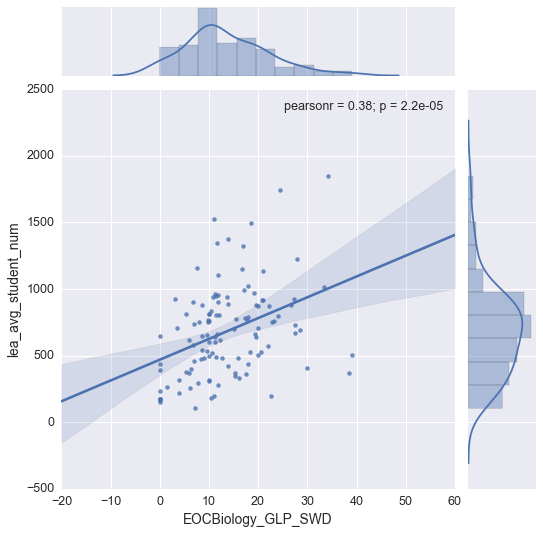

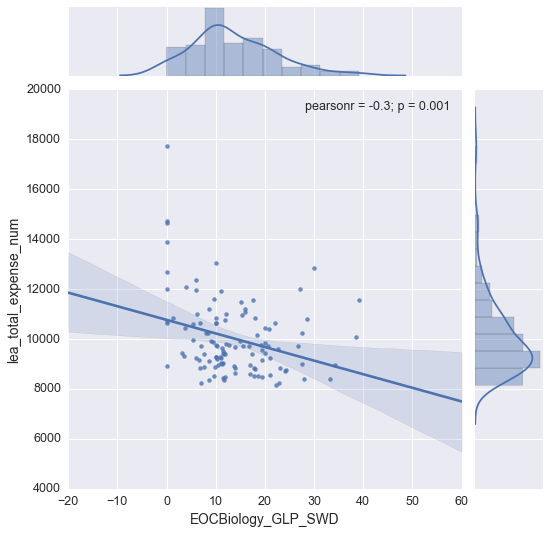

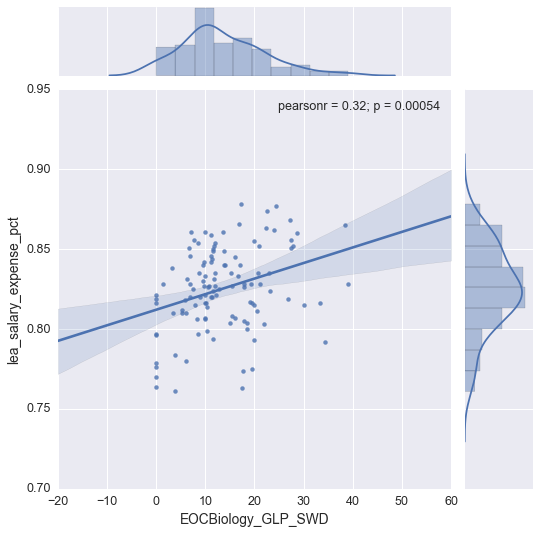

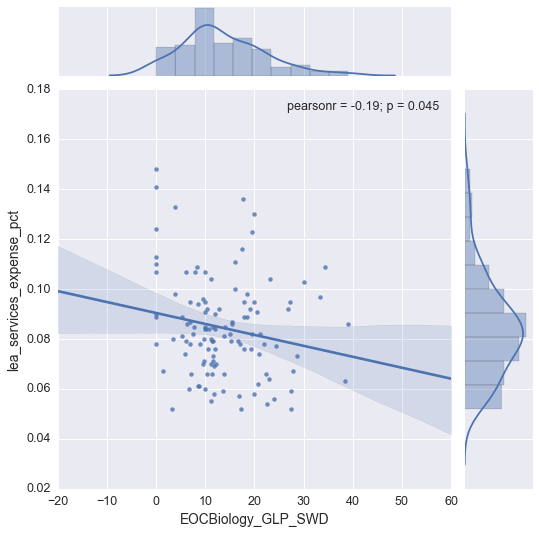

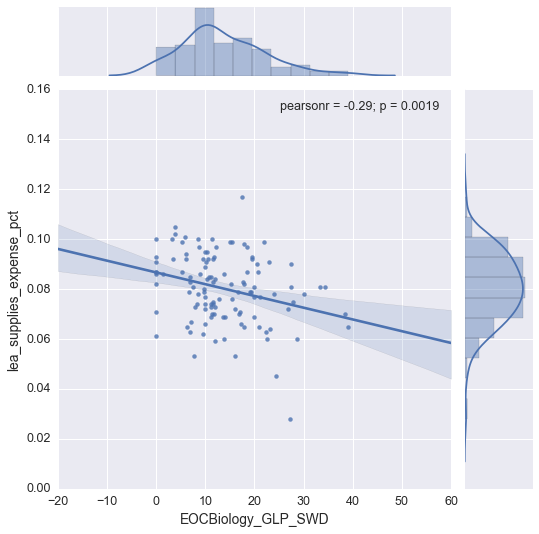

...

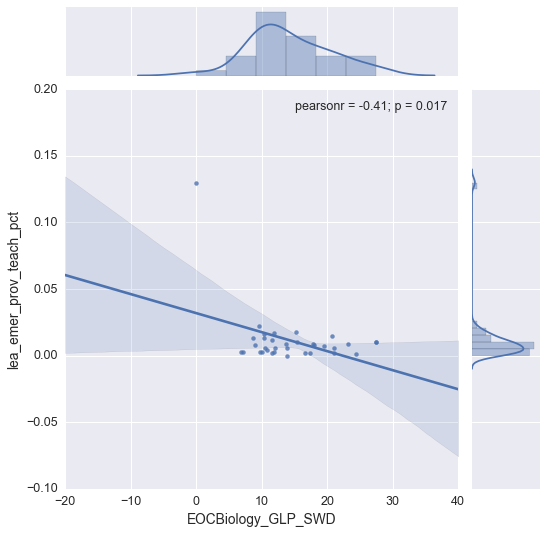

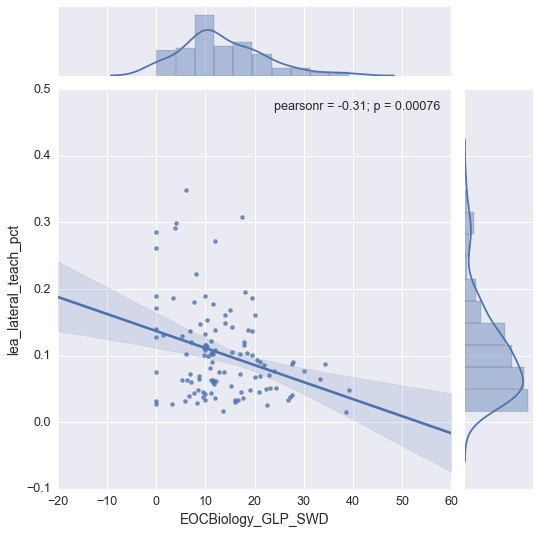

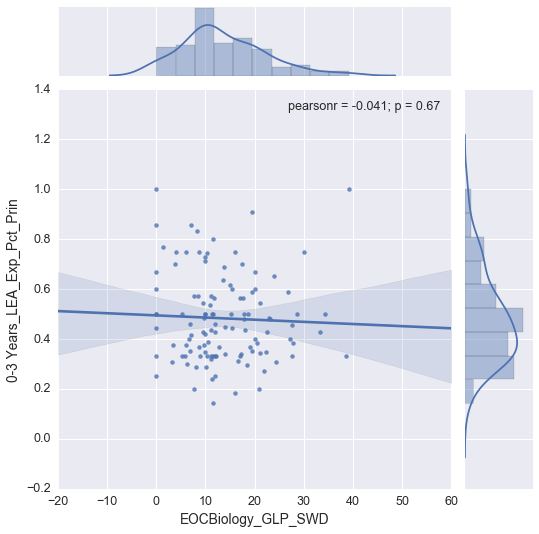

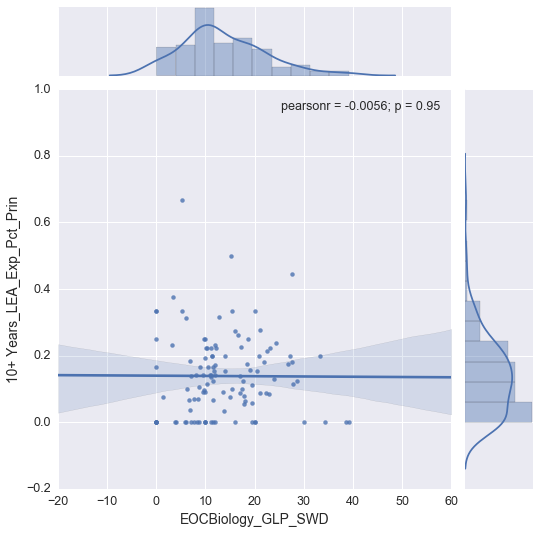

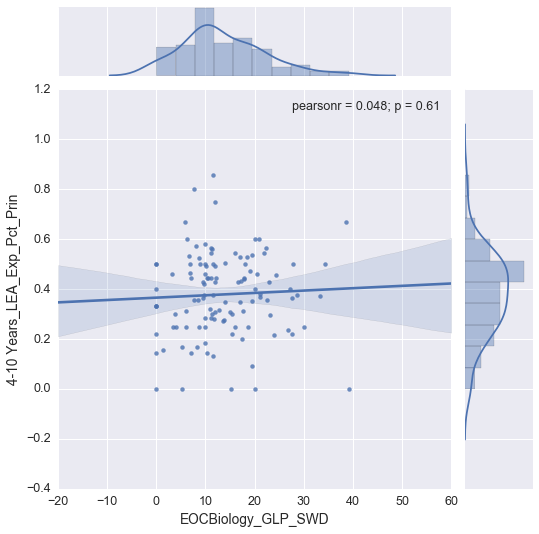

In [28]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCBiology_GLP_SWD',y=col, data=distSchoolData)
    except Exception:
        continue